In [ ]:
!pip install opencv-python==4.5.5.62
!pip install opencv-contrib-python==4.5.5.62
!pip install tf-explain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 MB 10.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.7.0.72
    Uninstalling opencv-python-4.7.0.72:
      Successfully uninstalled opencv-python-4.7.0.72
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.6/66.6 MB 9.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.7.0.72
    Uninstalling opencv-contrib-python-4.7.0.72:
      Successfully uninstalled opencv-contrib-python-4.7.0.72
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.8 MB/s eta 0:00:00


# New section

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import gc
import sys

import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import skimage
from skimage.feature import hog, canny
from skimage.filters import sobel
from skimage import color

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from keras import layers
import keras.backend as K
from keras.models import Sequential, Model
from keras.preprocessing import image
from keras.layers import Input, Dense, Activation, Dropout
from keras.layers import Flatten, BatchNormalization, Conv2D
from keras.layers import MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D 
from keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import ResNet50
from tf_explain.core.activations import ExtractActivations
from tf_explain.core.smoothgrad import SmoothGrad

from PIL import Image
from tqdm import tqdm
import random as rnd
import cv2
from keras.preprocessing.image import ImageDataGenerator
from numpy import expand_dims

!pip install livelossplot
from livelossplot import PlotLossesKeras

%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
train_path = r'/content/drive/MyDrive/Railway Track fault detection/Train'
val_path = r'/content/drive/MyDrive/Railway Track fault detection/Validation'
test_path = r'/content/drive/MyDrive/Railway Track fault detection/Test'

In [ ]:
train_df_defective = pd.DataFrame(os.listdir(train_path+'/Defective'))
val_df_defective = pd.DataFrame(os.listdir(val_path+'/Defective')) 
test_df_defective = pd.DataFrame(os.listdir(test_path+'/Defective')) 
train_df_undefective = pd.DataFrame(os.listdir(train_path+'/Non defective'))
val_df_undefective = pd.DataFrame(os.listdir(val_path+'/Non defective')) 
test_df_undefective = pd.DataFrame(os.listdir(test_path+'/Non defective')) 

In [ ]:
defective=pd.concat([train_df_defective,test_df_defective,val_df_defective], axis=0)
undefective=pd.concat([train_df_undefective,test_df_undefective,val_df_undefective], axis=0)

In [ ]:
print('Train samples defective: ', len(train_df_defective))
print('Val samples defective: ', len(val_df_defective))
print('Test samples defective: ', len(test_df_defective))
print()
print('Train samples undefective: ', len(train_df_undefective))
print('Val samples undefective: ', len(val_df_undefective))
print('Test samples undefective: ', len(test_df_undefective))

Train samples defective:  145
Val samples defective:  31
Test samples defective:  11

Train samples undefective:  39
Val samples undefective:  31
Test samples undefective:  11


In [ ]:
plt.figure(figsize = (15,12))
for idx,image_path in enumerate(train_df_defective[0]):
    if idx==31:
        break
    plt.subplot(4,8,idx+1)
    img = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Train/Defective/'+image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(idx)
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plt.figure(figsize = (15,12))
for idx,image_path in enumerate(train_df_undefective[0]):
    if idx==31:
        break
    plt.subplot(4,8,idx+1)
    img = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Train/Non defective/'+image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(idx)
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

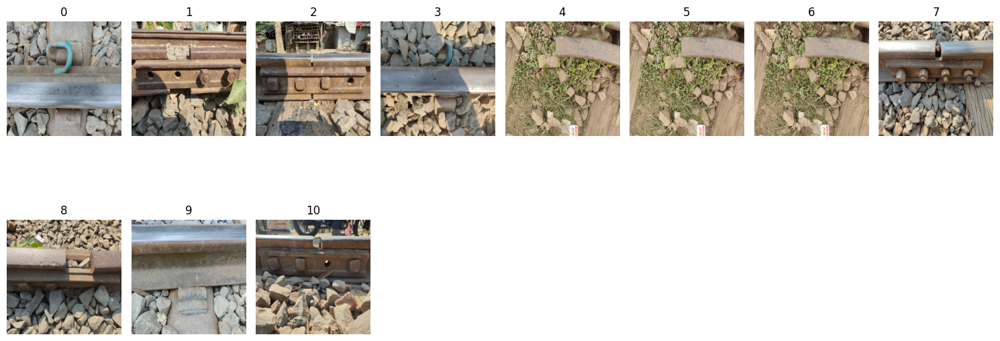

In [ ]:
plt.figure(figsize = (15,12))
for idx,image_path in enumerate(test_df_defective[0]):
    if idx==31:
        break
    plt.subplot(4,8,idx+1)
    img = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Test/Defective/'+image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(idx)
plt.tight_layout()
plt.show()

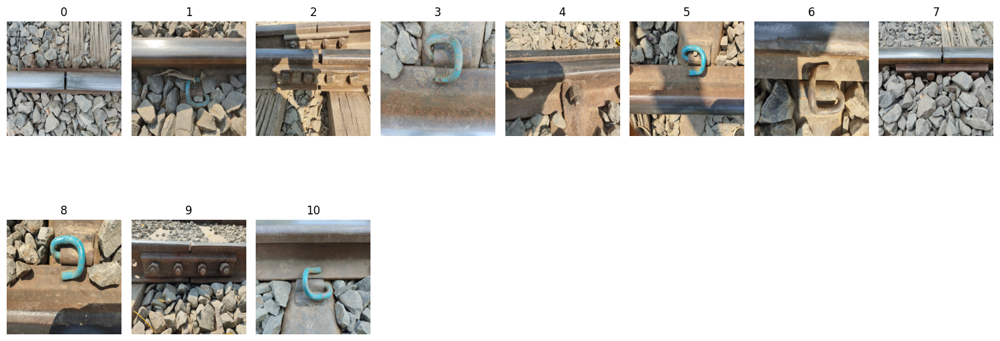

In [ ]:
plt.figure(figsize = (15,12))
for idx,image_path in enumerate(test_df_undefective[0]):
    if idx==31:
        break
    plt.subplot(4,8,idx+1)
    img = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Test/Non defective/'+image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(idx)
plt.tight_layout()
plt.show()

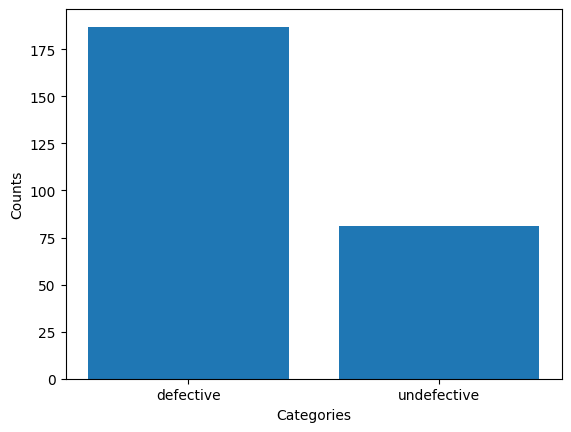

In [ ]:
y=[len(defective),len(undefective)]
x=['defective', 'undefective']

plt.xlabel('Categories')
plt.ylabel('Counts')
plt.bar(x, y)
plt.show()

In [ ]:
widths, heights = [], []
defective_path_images = []

for path in tqdm(defective[0]):
    try:
        width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Test/Defective/'+path).size
        widths.append(width)
        heights.append(height)
        defective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Test/Defective/'+path)
    except:
        try:
            width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Train/Defective/'+path).size
            widths.append(width)
            heights.append(height)
            defective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Train/Defective/'+path)
        except:
            try:
                width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Validation/Defective/'+path).size
                widths.append(width)
                heights.append(height)
                defective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Validation/Defective/'+path)
            except:
                continue
    
df_defective = pd.DataFrame()
df_defective["width"] = widths
df_defective["height"] = heights
df_defective["path"] = defective_path_images
df_defective["dimension"] = df_defective["width"] * df_defective["height"]

100%|██████████| 187/187 [00:14<00:00, 12.97it/s]


In [ ]:
df_defective.sort_values('width').head(84)

,width,height,path,dimension
16,156,322,/content/drive/MyDrive/Railway Track fault det...,50232
27,168,299,/content/drive/MyDrive/Railway Track fault det...,50232
26,194,148,/content/drive/MyDrive/Railway Track fault det...,28712
24,200,187,/content/drive/MyDrive/Railway Track fault det...,37400
25,220,165,/content/drive/MyDrive/Railway Track fault det...,36300
...,...,...,...,...
164,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
165,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
166,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
160,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000


In [ ]:
df_defective.head(84).mean()

<ipython-input-20-5d2bc5dfb720>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_defective.head(84).mean()


width        2.806488e+03
height       2.109048e+03
dimension    7.983162e+06
dtype: float64

In [ ]:
widths, heights = [], []
undefective_path_images = []

for path in tqdm(undefective[0]):
    try:
        width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Test/Non defective/'+path).size
        widths.append(width)
        heights.append(height)
        undefective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Test/Non defective/'+path)
    except:
        try:
            width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Train/Non defective/'+path).size
            widths.append(width)
            heights.append(height)
            undefective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Train/Non defective/'+path)
        except:
            try:
                width, height = Image.open(r'/content/drive/MyDrive/Railway Track fault detection/Validation/Non defective/'+path).shape
                print(width)
                widths.append(width)
                heights.append(height)
                undefective_path_images.append(r'/content/drive/MyDrive/Railway Track fault detection/Validation/Non defective/'+path)
            except:
                continue
    
df_undefective = pd.DataFrame()
df_undefective["width"] = widths
df_undefective["height"] = heights
df_undefective["path"] = undefective_path_images
df_undefective["dimension"] = df_undefective["width"] * df_undefective["height"]

100%|██████████| 81/81 [00:18<00:00,  4.48it/s]


In [ ]:
df_undefective.sort_values('width').tail(84)

,width,height,path,dimension
0,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
27,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
28,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
29,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
30,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
31,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
32,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
33,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
34,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000
35,4000,3000,/content/drive/MyDrive/Railway Track fault det...,12000000


In [ ]:
df_undefective.head(84).mean()

<ipython-input-24-228a704c59a0>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_undefective.head(84).mean()


width            4000.0
height           3000.0
dimension    12000000.0
dtype: float64

In [ ]:
gc.collect()

130432

In [ ]:
def is_grey_scale(givenImage):
    w,h = givenImage.size
    for i in range(w):
        for j in range(h):
            r,g,b = givenImage.getpixel((i,j))
            if r != g != b: return False
    return True

In [ ]:
def get_rgb_men(row):
    img = cv2.imread(row['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return np.sum(img[:,:,0]), np.sum(img[:,:,1]), np.sum(img[:,:,2])

tqdm.pandas()
df_defective['R'], df_defective['G'], df_defective['B'] = zip(*df_defective.progress_apply(lambda row: get_rgb_men(row), axis=1) )

100%|██████████| 187/187 [01:07<00:00,  2.76it/s]


In [ ]:
gc.collect()

0

In [ ]:
def show_color_dist(df, count):
    fig, axr = plt.subplots(count,2,figsize=(15,15))
    if df.empty:
        print("Image internsity of selected color is weak")
        return
    for idx, i in enumerate(np.random.choice(df['path'], count)):
        img = cv2.imread(i)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axr[idx,0].imshow(img)
        axr[idx,0].axis('off')
        axr[idx,1].set_title('R={:.0f}, G={:.0f}, B={:.0f} '.format(np.mean(img[:,:,0]), np.mean(img[:,:,1]), np.mean(img[:,:,2]))) 
        x, y = np.histogram(img[:,:,0], bins=255)
        axr[idx,1].bar(y[:-1], x, label='R', alpha=0.8, color='red')
        x, y = np.histogram(img[:,:,1], bins=255)
        axr[idx,1].bar(y[:-1], x, label='G', alpha=0.8, color='green')
        x, y = np.histogram(img[:,:,2], bins=255)
        axr[idx,1].bar(y[:-1], x, label='B', alpha=0.8, color='blue')
        axr[idx,1].legend()
        axr[idx,1].axis('off')

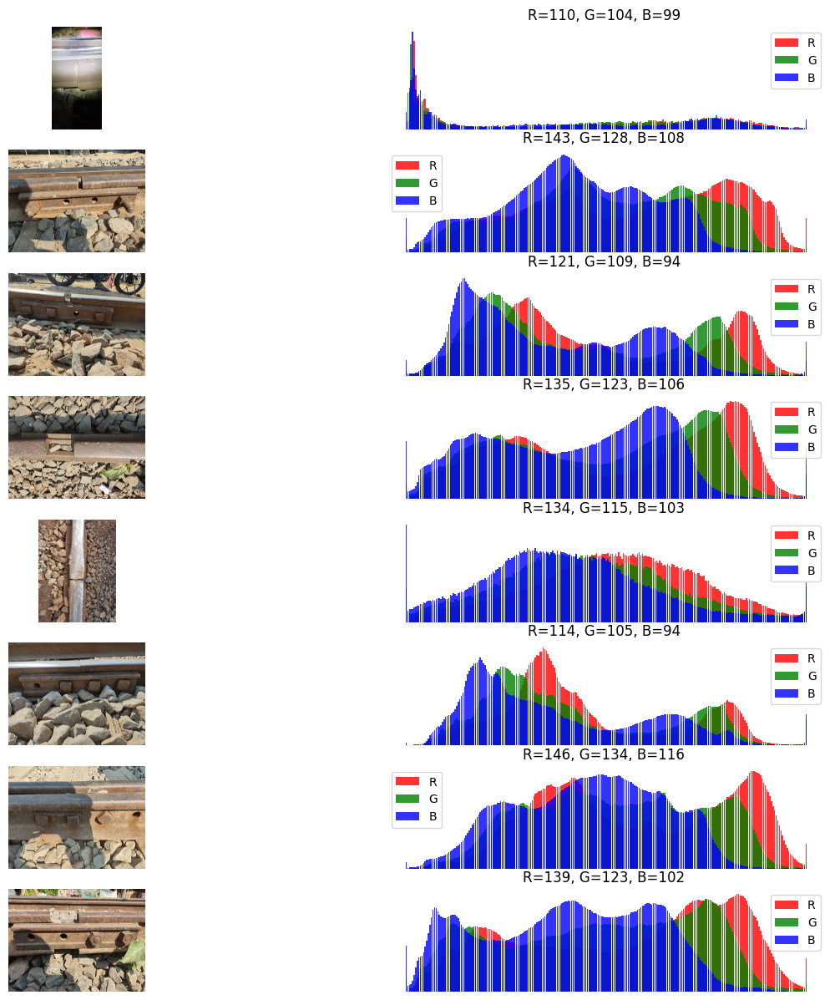

In [ ]:
df = df_defective[((df_defective['B']*1.05) < df_defective['R']) & ((df_defective['G']*1.05) < df_defective['R'])]
show_color_dist(df, 8)

In [ ]:
df = df_undefective[((df_undefective['B']*1.05) < df_undefective['R']) & ((df_undefective['G']*1.05) < df_undefective['R'])]
show_color_dist(df, 8)

KeyError: ignored

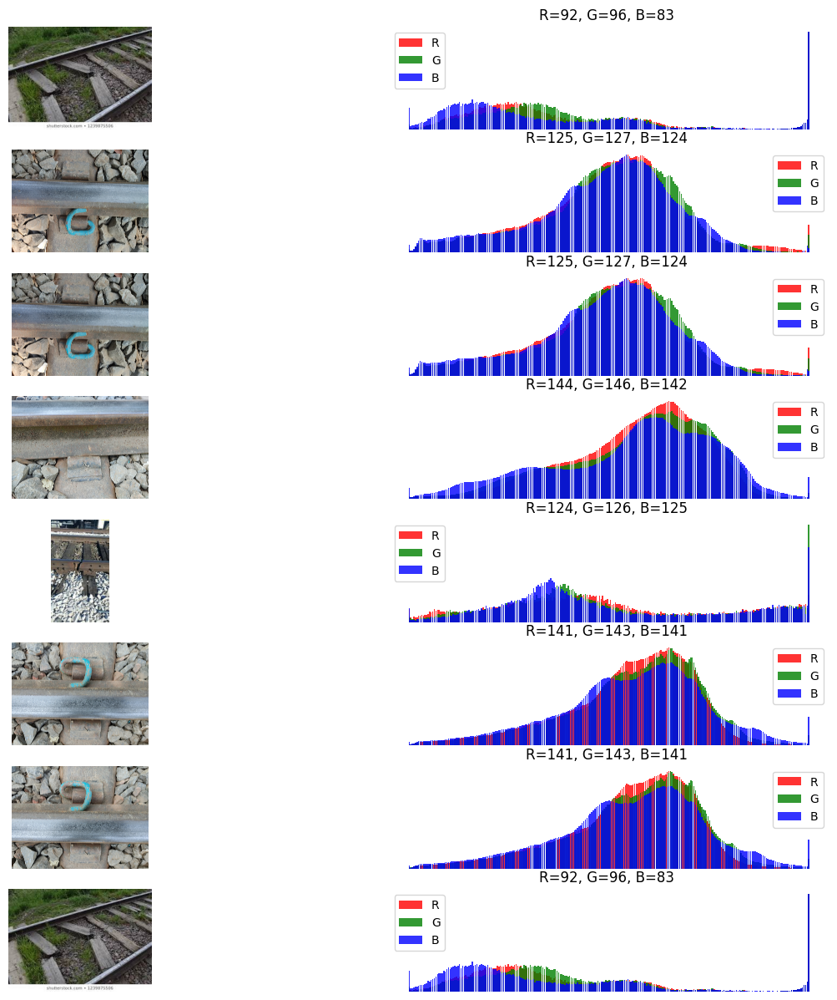

In [ ]:
df = df_defective[(df_defective['G'] > df_defective['R']) & (df_defective['G'] > df_defective['B'])]
show_color_dist(df, 8)

In [ ]:
df = df_undefective[(df_undefective['G'] > df_undefective['R']) & (df_undefective['G'] > df_undefective['B'])]
show_color_dist(df, 8)

NameError: ignored

In [ ]:
gc.collect()

396586

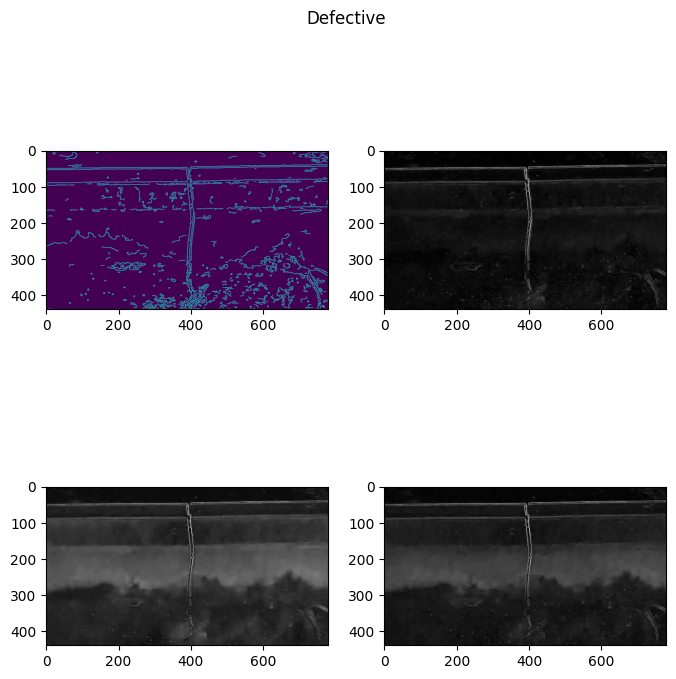

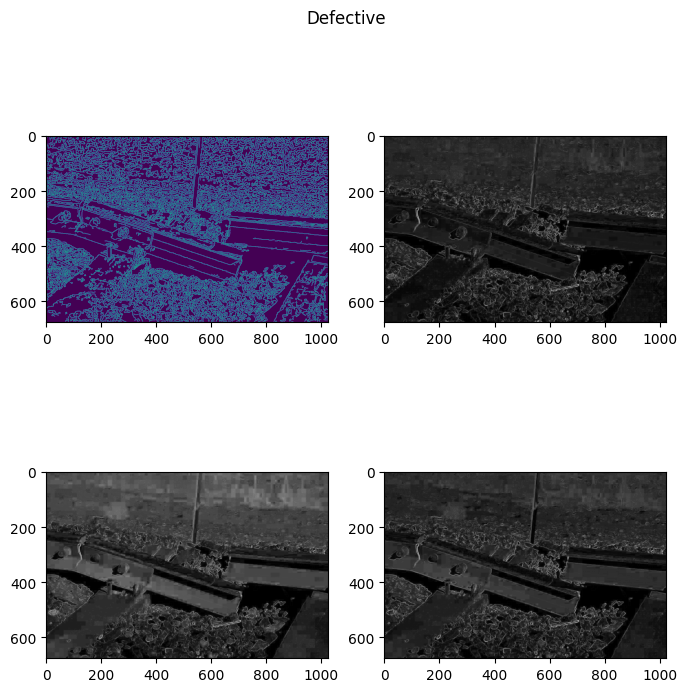

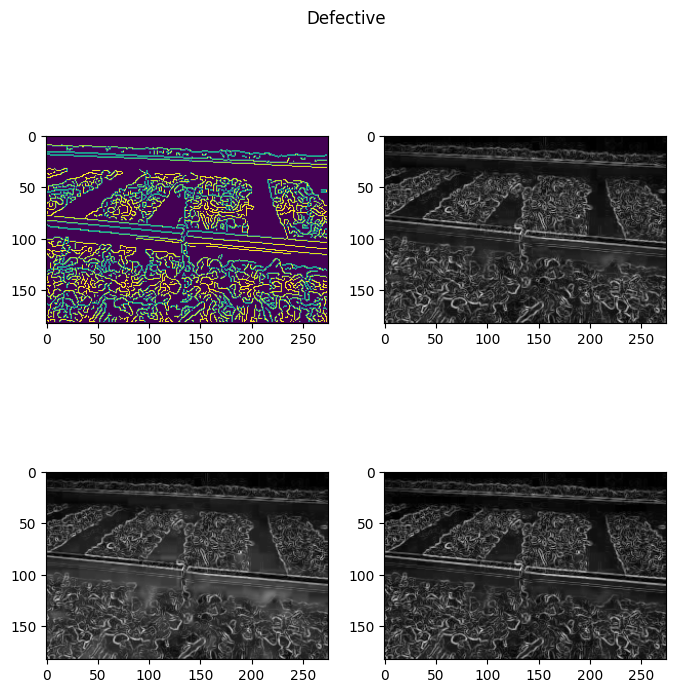

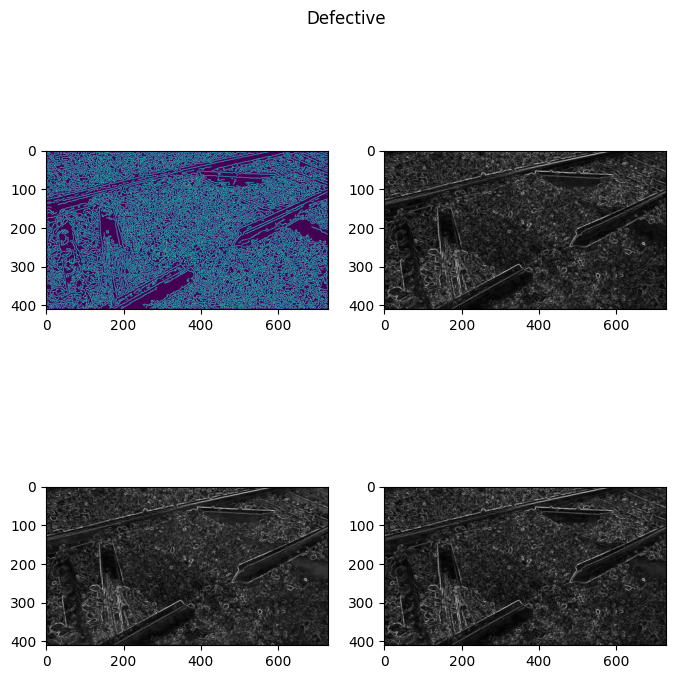

In [ ]:
for path in df_defective['path'].head(4):
    image = cv2.imread(path)
    gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = sobel(image)
    gray_edges=canny(gray)
    dimension = edges.shape
    fig = plt.figure(figsize=(8, 8))
    plt.suptitle("Defective")
    plt.subplot(2,2,1)
    plt.imshow(gray_edges)
    plt.subplot(2,2,2)
    plt.imshow(edges[:dimension[0],:dimension[1],0], cmap="gray")
    plt.subplot(2,2,3)
    plt.imshow(edges[:dimension[0],:dimension[1],1], cmap='gray')
    plt.subplot(2,2,4)
    plt.imshow(edges[:dimension[0],:dimension[1],2], cmap='gray')
plt.show()

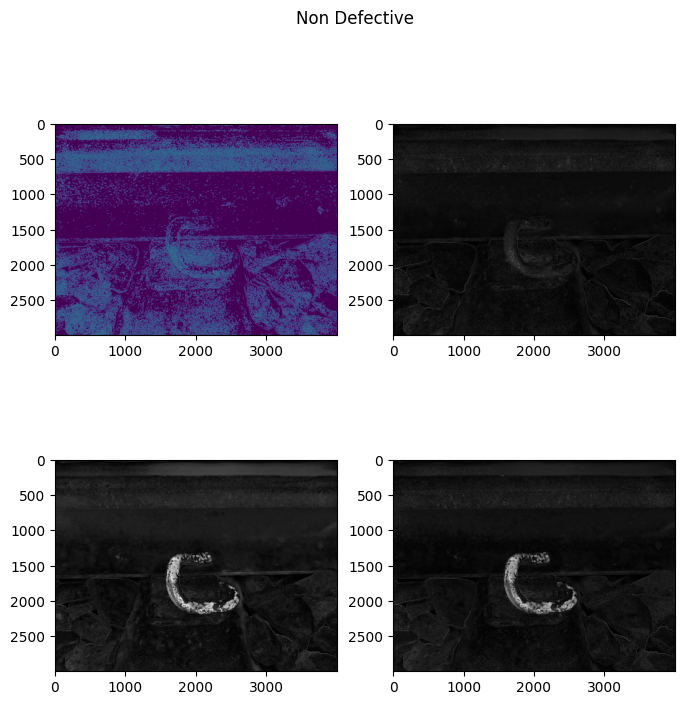

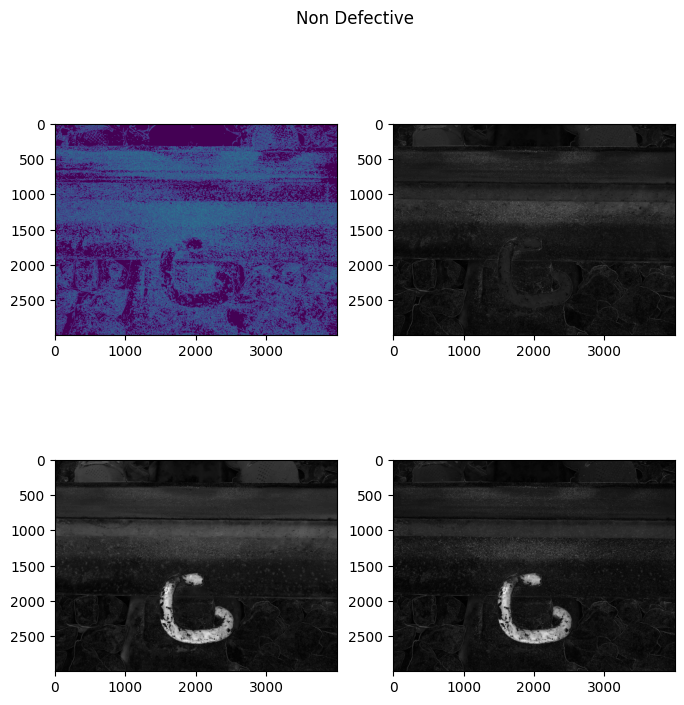

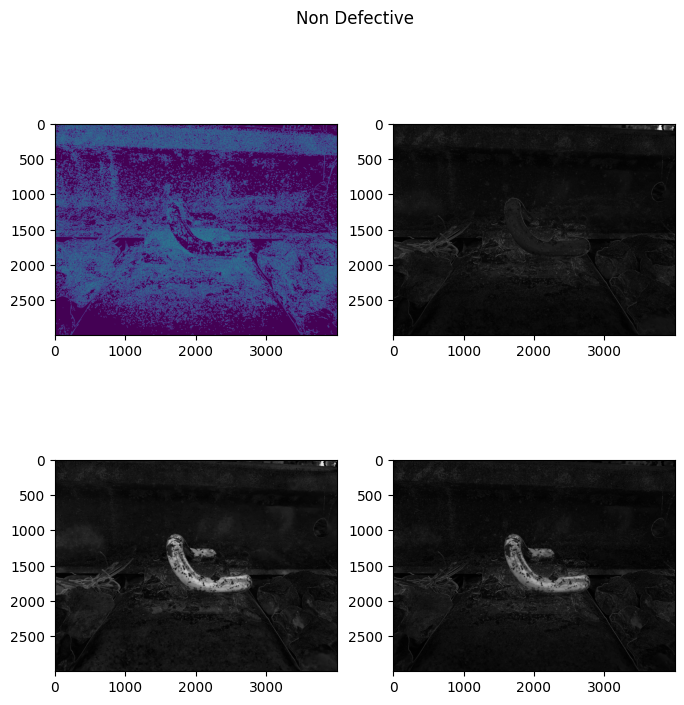

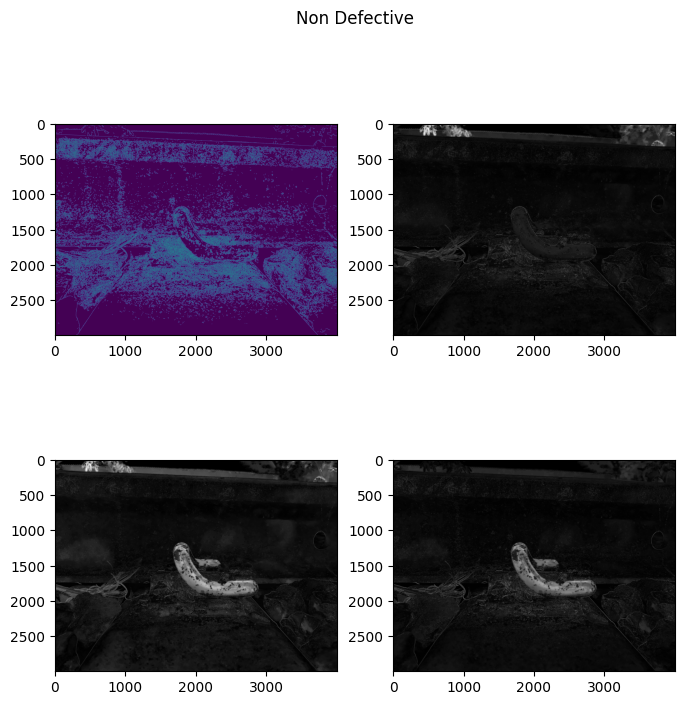

In [ ]:
for path in df_undefective['path'].head(4):
    image = cv2.imread(path)
    gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = sobel(image)
    gray_edges=canny(gray)
    dimension = edges.shape
    fig = plt.figure(figsize=(8, 8))
    plt.suptitle("Non Defective")
    plt.subplot(2,2,1)
    plt.imshow(gray_edges)
    plt.subplot(2,2,2)
    plt.imshow(edges[:dimension[0],:dimension[1],0], cmap="gray")
    plt.subplot(2,2,3)
    plt.imshow(edges[:dimension[0],:dimension[1],1], cmap='gray')
    plt.subplot(2,2,4)
    plt.imshow(edges[:dimension[0],:dimension[1],2], cmap='gray')
plt.show()


In [ ]:
gc.collect()

82464

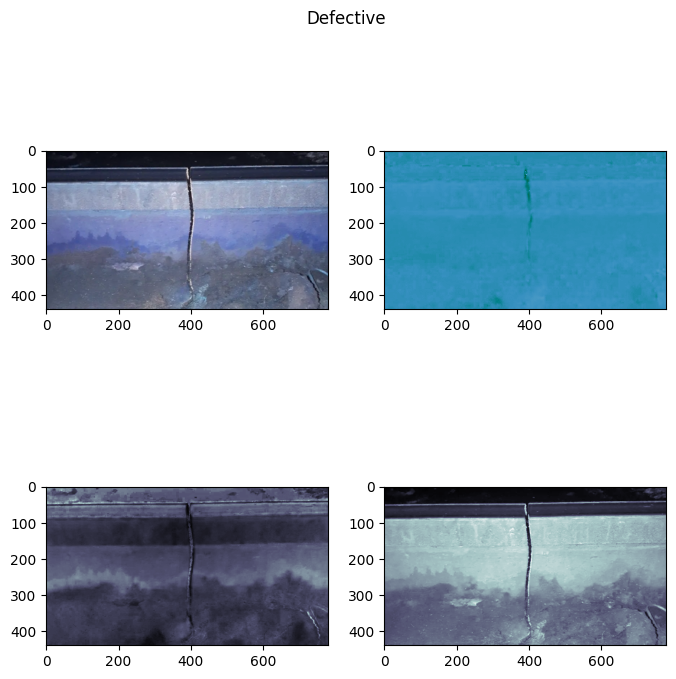

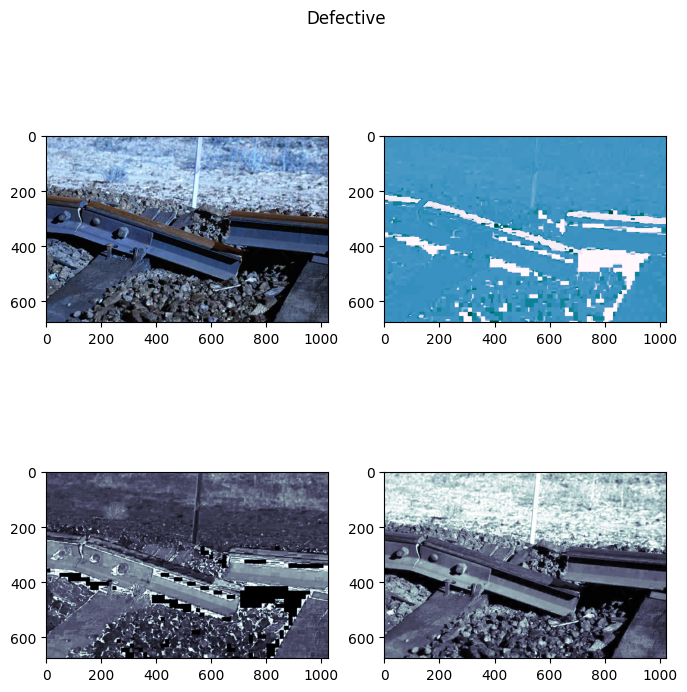

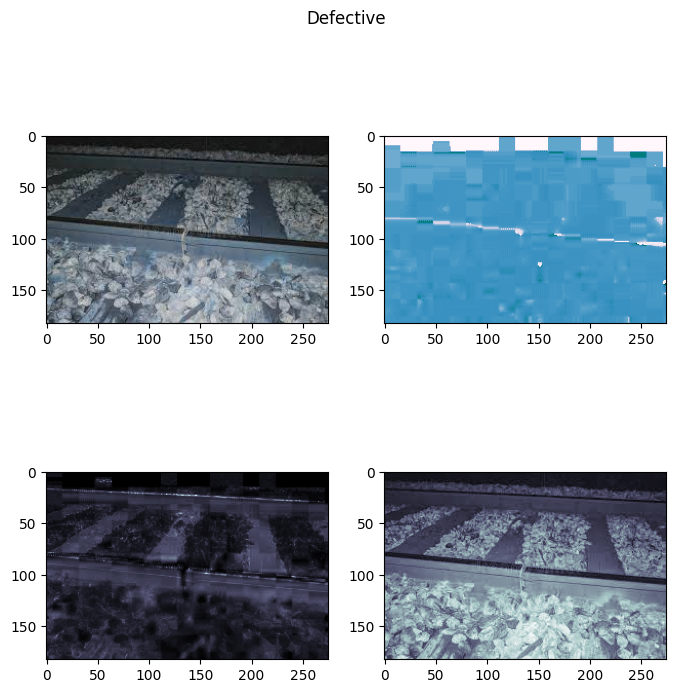

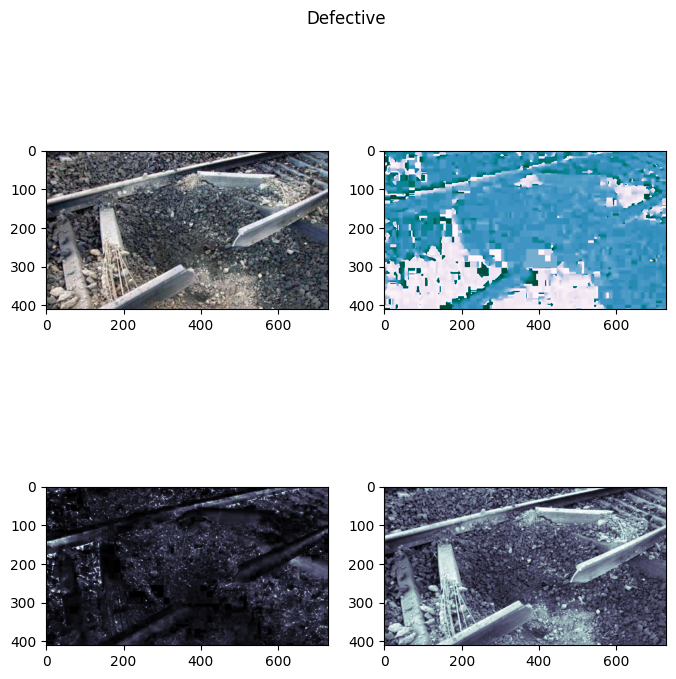

In [ ]:
for path in df_defective['path'].head(4):
    image = cv2.imread(path)
    hsv = color.rgb2hsv(image)
    dimension = hsv.shape
    fig = plt.figure(figsize=(8, 8))
    plt.suptitle("Defective")
    plt.subplot(2,2,1)
    plt.imshow(image)
    plt.subplot(2,2,2)
    plt.imshow(hsv[:dimension[0],:dimension[1],0], cmap="PuBuGn")
    plt.subplot(2,2,3)
    plt.imshow(hsv[:dimension[0],:dimension[1],1], cmap='bone')
    plt.subplot(2,2,4)
    plt.imshow(hsv[:dimension[0],:dimension[1],2], cmap='bone')
plt.show()

In [ ]:
for path in df_undefective['path'].head(4):
    image = cv2.imread(path)
    hsv = color.rgb2hsv(image)
    dimension = hsv.shape
    fig = plt.figure(figsize=(8, 8))
    plt.suptitle("Non defective")
    plt.subplot(2,2,1)
    plt.imshow(image)
    plt.subplot(2,2,2)
    plt.imshow(hsv[:dimension[0],:dimension[1],0], cmap="PuBuGn")
    plt.subplot(2,2,3)
    plt.imshow(hsv[:dimension[0],:dimension[1],1], cmap='bone')
    plt.subplot(2,2,4)
    plt.imshow(hsv[:dimension[0],:dimension[1],2], cmap='bone')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
gc.collect()

94557

In [ ]:
def corners_images_gray(main_df, class_name):
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        corners_gray = cv2.goodFeaturesToTrack(gray, maxCorners=50, qualityLevel=0.02, minDistance=20)
        corners_gray = np.float32(corners_gray)
        for item in corners_gray:
            x, y = item[0]
            cv2.circle(image, (int(x), int(y)), 6, (0, 255, 0), -1)
        fig = plt.figure(figsize=(32, 32))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(image, cmap="BuGn")
        plt.show()

In [ ]:
corners_images_gray(df_defective, "Defective")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
corners_images_gray(df_undefective, "Undefective")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
gc.collect()

13867

In [ ]:
def sift_images_gray(main_df, class_name):
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        sift = cv2.SIFT_create()
        kp, des = sift.detectAndCompute(gray, None)
        kp_img = cv2.drawKeypoints(image, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        fig = plt.figure(figsize=(32, 32))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(kp_img, cmap="viridis")
        plt.show()

In [ ]:
sift_images_gray(df_defective, "Defective")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
sift_images_gray(df_undefective, "Undefective")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
gc.collect()

17723

In [ ]:
def hog_images(main_df, class_name):
    for idx,i in enumerate(np.random.choice(main_df['path'],4)):
        image = cv2.imread(i)
        fd, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True, multichannel=True)
        fig = plt.figure(figsize=(32, 32))
        plt.suptitle(class_name)
        plt.subplot(2,2,1)
        plt.imshow(hog_image, cmap="viridis")
        plt.show()

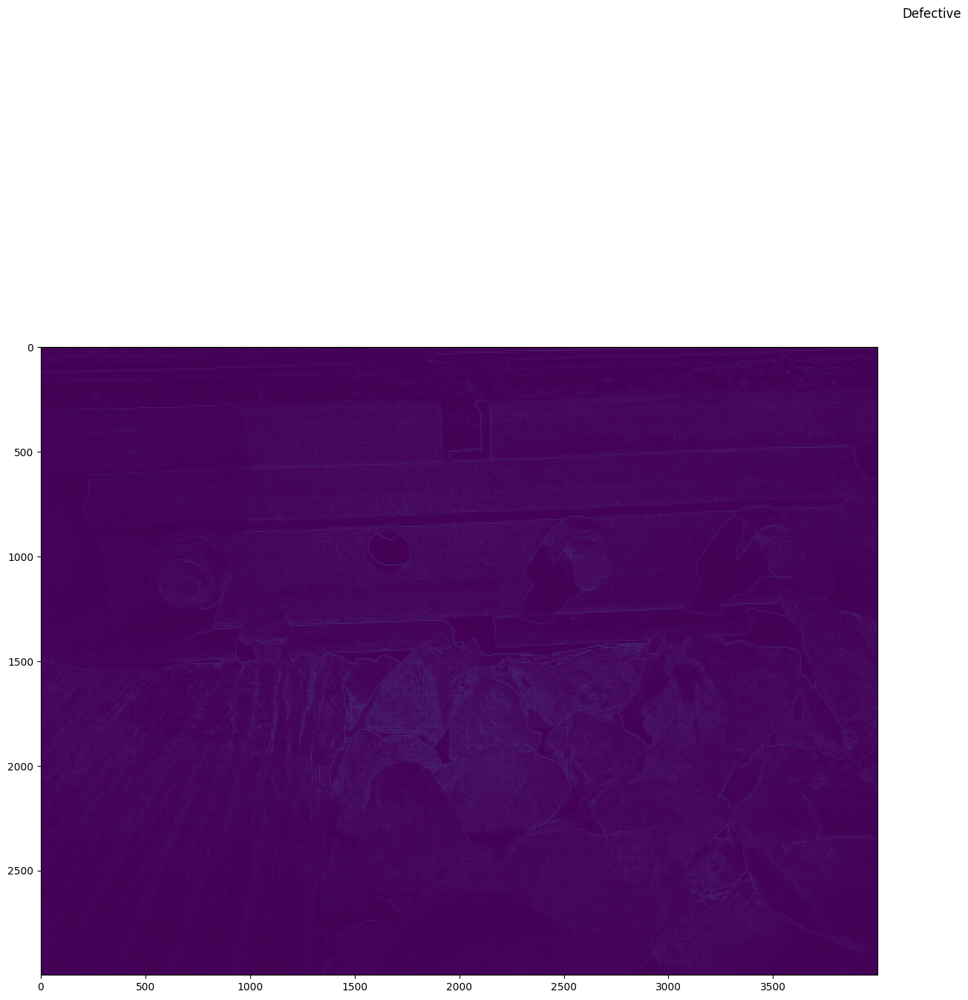

In [ ]:
hog_images(df_defective, "Defective")

In [ ]:
gc.collect()

21336

In [ ]:
def plot_augimages(paths, datagen):
    plt.figure(figsize = (14,28))
    plt.suptitle('Augmented Images')
    
    midx = 0
    for path in paths:
        data = Image.open(path)
        data = data.resize((224,224))
        samples = expand_dims(data, 0)
        it = datagen.flow(samples, batch_size=1)
    
       
        plt.subplot(10,5, midx+1)
        plt.imshow(data)
        plt.axis('off')
    
       
        for idx, i in enumerate(range(4)):
            midx += 1
            plt.subplot(10,5, midx+1)
            
            batch = it.next()
            image = batch[0].astype('uint8')
            plt.imshow(image)
            plt.axis('off')
        midx += 1
    
    plt.tight_layout()
    plt.show()

In [ ]:
test_datagen = ImageDataGenerator()
test_generator = test_datagen.flow_from_directory(
    directory='/content/drive/MyDrive/Railway Track fault detection/Test',
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42
)

Found 22 images belonging to 2 classes.


***VGG*** ***GENERATOR***

VGG stands for Visual Geometry Group; it is a standard deep Convolutional Neural Network (CNN)architecture with multiple layers. The “deep” refers to the number of layers with VGG-16 or VGG-19 consisting of 16 and 19 convolutional layers.

In [ ]:
from keras.applications.vgg16 import preprocess_input

In [ ]:
vgg_datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.10,
    brightness_range=[0.6,1.4],
    channel_shift_range=0.7,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
) 
train_generator_vgg = vgg_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Train",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
    
)
val_generator_vgg = vgg_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Validation",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
)

Found 183 images belonging to 2 classes.
Found 62 images belonging to 2 classes.


In [ ]:
plot_augimages(np.random.choice(df_defective['path'],10), vgg_datagen)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plot_augimages(np.random.choice(df_undefective['path'],10), vgg_datagen)

Output hidden; open in https://colab.research.google.com to view.

**RESNET50**
ResNet-50 is a 50-layer convolutional neural network (48 convolutional layers, one MaxPool layer, and one average pool layer). Residual neural networks are a type of artificial neural network (ANN) that forms networks by stacking residual blocks. 


In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input

In [ ]:
resnet50_datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.10,
    brightness_range=[0.6,1.4],
    channel_shift_range=0.7,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
) 
resnet50_train = resnet50_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Train",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
    
)
resnet50_val = resnet50_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Validation",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
)

Found 183 images belonging to 2 classes.
Found 62 images belonging to 2 classes.


In [ ]:
plot_augimages(np.random.choice(df_defective['path'],10), resnet50_datagen)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
plot_augimages(np.random.choice(df_undefective['path'],10), resnet50_datagen)

Output hidden; open in https://colab.research.google.com to view.

INCEPTION V3

In [ ]:
from tensorflow.keras.applications.inception_v3 import preprocess_input

Inception v3 is a convolutional neural network for assisting in image analysis and object detection, and got its start as a module for GoogLeNet.

In [ ]:
inception_v3_datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.10,
    brightness_range=[0.6,1.4],
    channel_shift_range=0.7,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
) 
inception_v3_train = inception_v3_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Train",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
    
)
inception_v3_val = inception_v3_datagen.flow_from_directory(
    directory="/content/drive/MyDrive/Railway Track fault detection/Validation",
    target_size=(448, 448),
    color_mode="rgb",
    batch_size=32,
    class_mode="binary",
    shuffle=True,
    seed=42,
)

Found 183 images belonging to 2 classes.
Found 62 images belonging to 2 classes.


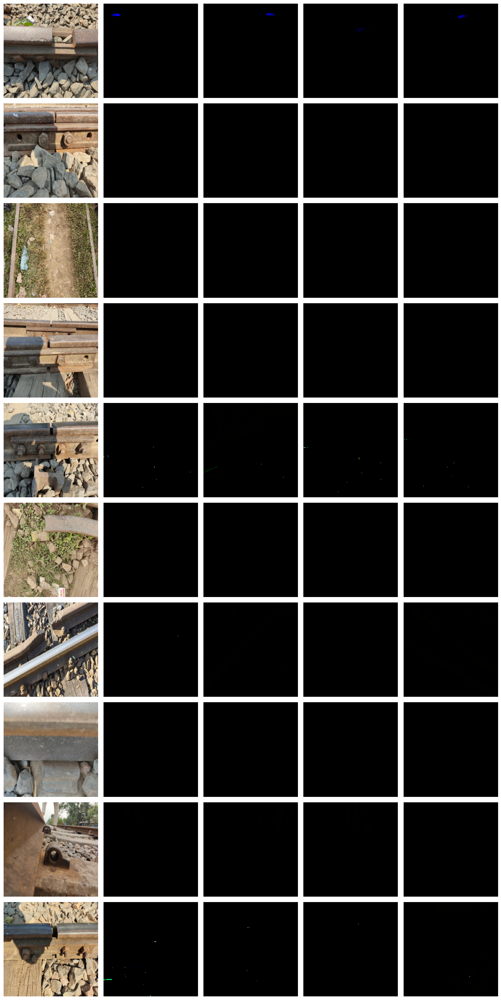

In [ ]:
plot_augimages(np.random.choice(df_defective['path'],10), inception_v3_datagen)

MODELLING   
VGG


In [ ]:
vgg16 = VGG16(include_top = False, input_shape = (448,448,3), weights = 'imagenet')

for layer in vgg16.layers:
    layer.trainable = False

x = GlobalAveragePooling2D()(vgg16.output)
predictions = Dense(1, activation='sigmoid')(x)

model_vgg = Model(inputs = vgg16.input, outputs = predictions)

58889256/58889256 [==============================] - 0s 0us/step


RESNET50

In [ ]:
resnet50 = ResNet50(include_top = False, input_shape = (448,448,3), weights = 'imagenet')

for layer in resnet50.layers:
    layer.trainable = False

x = GlobalAveragePooling2D()(resnet50.output)
predictions = Dense(1, activation='sigmoid')(x)

model_resnet50 = Model(inputs = resnet50.input, outputs = predictions)

94765736/94765736 [==============================] - 1s 0us/step


inception v3

In [ ]:
inceptionV3 = InceptionV3(include_top = False, input_shape = (448,448,3), weights = 'imagenet')

for layer in inceptionV3.layers:
    layer.trainable = False

x = GlobalAveragePooling2D()(inceptionV3.output)
predictions = Dense(1, activation='sigmoid')(x)

model_inception_v3 = Model(inputs = inceptionV3.input, outputs = predictions)

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
gc.collect()

241

In [ ]:
model_vgg.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

In [ ]:
model_resnet50.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

In [ ]:
model_inception_v3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

Training differnt models
VGG

In [ ]:
import cv2
import numpy as np
img = cv2.imread('drive/My Drive/DSALabProj/Railway Track fault Detection Updated/Validation/Defective/IMG_20201114_102159.jpg')
plt.imshow(img)
img = cv2.resize(img,(448,448))
img = np.reshape(img,[1,448,448,3])

classes = model_inception_v3.predict(img)

print(classes)
if classes<0.5:
    print("This Railway track has no fault")
else:
    print("This Railway track has fault")

NameError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
img = cv2.imread('/content/drive/MyDrive/Railway Track fault detection/Validation/Defective/IMG_20201114_102736.jpg')
plt.imshow(img)
img = cv2.resize(img,(448,448))
img = np.reshape(img,[1,448,448,3])

classes = model_inception_v3.predict(img)

print(classes)
if classes<0.5:
    print("This Railway track has no fault")
else:
    print("This Railway track has fault")

NameError: ignored